## Clean pipeline for andvanced lane lines detection

In [1]:
import imp as mp
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
%matplotlib inline
import glob
import pickle
import pandas as pd
from math import ceil

#---------
import DrawLaneLines as dll
import Curves as crv
import Thresholds as trs
import Distortion as dstr
import Perspective as prsp

## Step1. Pipeline for distortion elimination

In [2]:
import Distortion as dst

In [4]:
mp.reload(dst)

<module 'Distortion' from '/Users/ng250023/PYTHON/PROJECTS/SLFDR/PROJECT2_ADVANCED_LL_DETECTION/Distortion.py'>

2 10


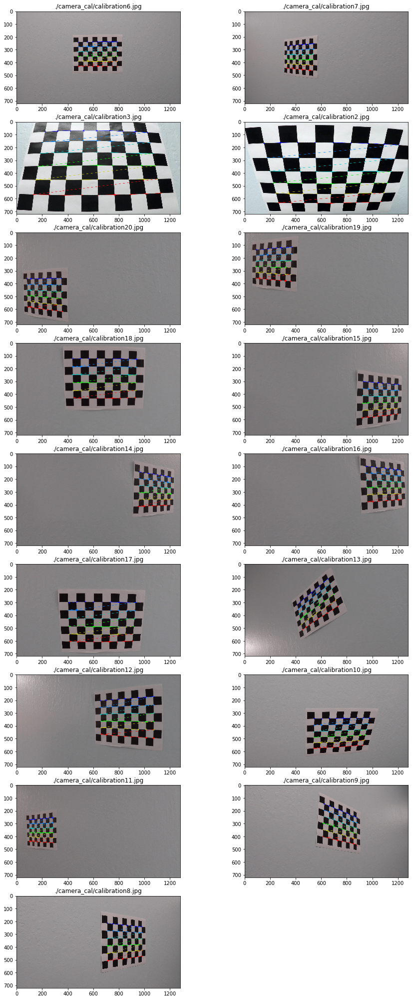

In [5]:
dst.get_distortion_mts_dist_mod()

## Test undistor block

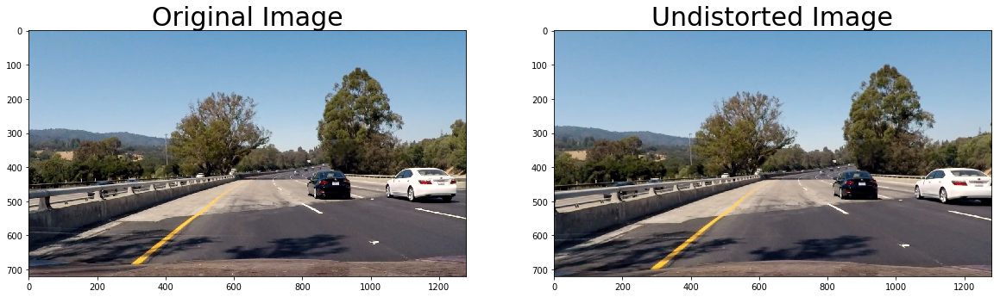

In [6]:
fname='./test_images/test4.jpg'
dst.print_orig_undistorted(fname)

## Step2. Pipeline to get perspective matrices

In [7]:
import Perspective as psp

In [9]:
mp.reload(psp)
mp.reload(dll)
mp.reload(trs)

<module 'Thresholds' from '/Users/ng250023/PYTHON/PROJECTS/SLFDR/PROJECT2_ADVANCED_LL_DETECTION/Thresholds.py'>

##  Get distortion pipeline

This image is: <class 'numpy.ndarray'> with dimensions: (720, 1280, 3)
------CHECK------- 0.65 0.9
Point1= [1113, 720, 655, 432]
Point2= [204, 720, 623, 432]
LeftPoint1: y1= 468 x1= 712
LeftPoint2: y2= 648 x2= 998
RightPoint1: y1= 468 x1= 570
RightPoint2: y2= 648 x2= 308
LeftPoint: y1= 468 x_hat= 998
RightPoint: y1= 468 x_hat= 308
right line lower [712, 468, 998, 648]
left line lower [570, 468, 308, 648]
right line should be: [998, 468, 998, 648]
left line should be: [308, 468, 308, 648]


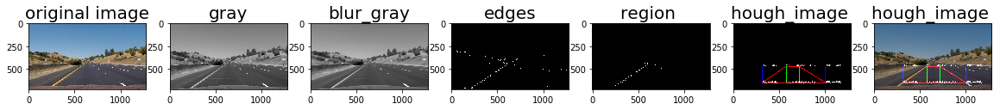

In [10]:
psp.generate_perspective_pipeline()

Image shape (720, 1280, 3)


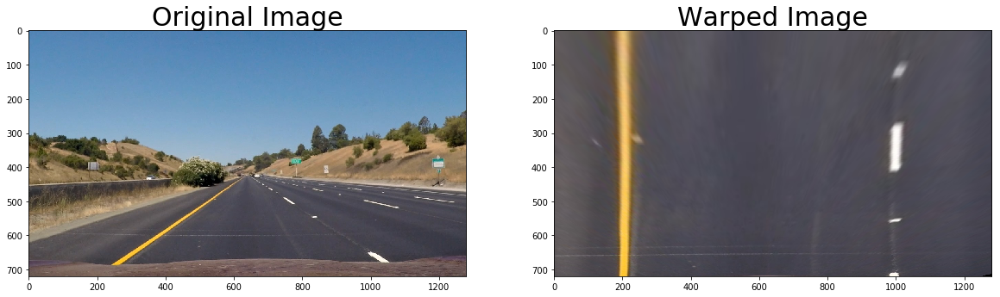

In [11]:
image = mpimg.imread('test_images/straight_lines1.jpg')
psp.get_unwarped_image(image)

## Step 3.Gradient and color transforations

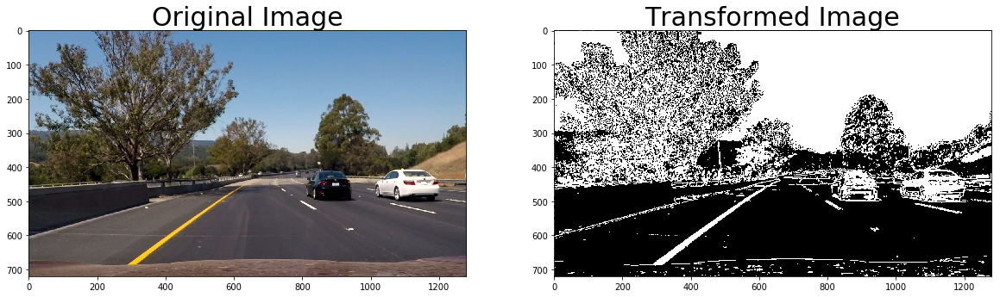

In [13]:
image = mpimg.imread('test_images/test6.jpg')
trs.get_transformed_image(image)

## Step4. Final pipeline 

In [14]:
mp.reload(dll)
mp.reload(dstr)
mp.reload(crv)
mp.reload(trs)
mp.reload(prsp)

<module 'Perspective' from '/Users/ng250023/PYTHON/PROJECTS/SLFDR/PROJECT2_ADVANCED_LL_DETECTION/Perspective.py'>

In [15]:
def get_last_6_poly():
    
    '''
    function takes last num threshold curves
    '''
    threshold=6
    count_images=len(left_fit_list)

    if  count_images>=threshold:
        left_fin  = sum(left_fit_list[-threshold:])/threshold
        right_fin = sum(right_fit_list[-threshold:])/threshold
    else:
        left_fin  = sum(left_fit_list[-count_images:])/count_images
        right_fin = sum(right_fit_list[-count_images:])/count_images
      
    #display(left_fin)
    #display(right_fin)
    
    return left_fin,right_fin

In [24]:
global left_fit_list
global right_fit_list

left_fit_list  = []
right_fit_list = []

def final_p(img): 


    # make a copy of the iamge 
    image=img.copy()
    #print(image.shape)

    
    mtx,dist=dstr.get_mtx_dist_from_pickle_file()
    undist = cv2.undistort(image, mtx, dist, None, mtx)

   
    #edges = apply_all_filters(undist)
    
    edges = trs.combined_threshold(undist)

    M,Minv=prsp.load_PERSP_from_pickle_file()
    
    # get warped image 
    warped = cv2.warpPerspective(edges, M, (edges.shape[1],edges.shape[0]))
    
    
    
    poly_line_img,left_fit,right_fit,_= crv.fit_polynomial(warped)
    
    
    ##print(len(left_fit_list))
    
    
    
    #total number of images
    #fill the list with the values from consequtive 6 images
   
    if  len(left_fit_list)<6:

        left_fit_list.append(left_fit)
        right_fit_list.append(right_fit)
        #print("Hi there I'm within 6 :",len(left_fit_list))
    
    #take values from the last 6 images
    left_fit_6,right_fit_6=get_last_6_poly()
    
    # fill smoothed image based on previous (smooothing on smoothing)
    if  len(left_fit_list)>=6:
        #print("Hi there I'm outside 6 :",len(left_fit_list))
        left_fit_list.append(left_fit_6)
        right_fit_list.append(right_fit_6)

    

    poly_img,left_fitx,right_fitx,ploty,left_fit0,right_fit0 = crv.search_around_poly(warped,left_fit_6,right_fit_6)
  
   
    car_position=int((max(left_fitx)+max(right_fitx))/2)
    image_center=image.shape[1]/2
    
    #print('car position',car_position)
    #print('Image center',image_center)
    
    
    xm_per_pix = 3.7/800
    offset=(image_center-car_position)*xm_per_pix
    
    #print('Offset=',round(offset,2))

    
    left_curverad, right_curverad = crv.measure_curvature_real(left_fit0,right_fit0,ploty)
    #print('Left Cureved Radius:',left_curverad,'Right Curved Radius:',right_curverad)
    mid_radius=int((left_curverad+right_curverad)/2)
    
    ##measure_curvature_pixels(left_fit,right_fit,ploty)

    # Create an image to draw the lines on
    warp_zero  = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (warped.shape[1], warped.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    #result=cv2.putText(result,'Left radius='+str(int(left_curverad)),(100,100), font, 1.5,(255,255,0),5)
    #result=cv2.putText(result,'Right radius='+str(int(right_curverad)),(100,150), font, 1.5,(255,255,0),5)
    result=cv2.putText(result,'Radius='+str(int(mid_radius))+' m',(100,100), font, 1.5,(255,255,0),5)
    result=cv2.putText(result,'Offset='+str(round(offset,2))+' m',(100,150), font, 1.5,(255,255,0),5)

    #Display the image
    ##plt.imshow(result)
    
    
    #----   visualization --------
    
    '''
    f, (ax1,ax2,ax3,ax4,ax5,ax6) = plt.subplots(1, 6, figsize=(20,10))
    ax1.imshow(undist,cmap='gray')
    ax1.set_title('undist', fontsize=30)
    #ax2.imshow(blur_gray ,cmap='gray')
    #ax2.set_title('blur', fontsize=30)
    ax2.imshow(edges,cmap='gray')
    ax2.set_title('edges', fontsize=30)
    ax3.imshow(warped,cmap='gray')
    ax3.set_title('warped ', fontsize=30)
    #----
    ax4.imshow(poly_line_img,cmap='gray')
    ax4.set_title('find points ', fontsize=30)
    ax5.imshow(poly_img,cmap='gray')
    ax5.set_title('poly ', fontsize=30)
    ax6.imshow(result,cmap='gray')
    ax6.set_title('final ', fontsize=30)
    plt.show()
    
    '''
    
    #return result
    
    #edges = edges * 255
    #print(edges.shape)
    #edges = np.asarray(edges)
    
    
    
    return result

In [25]:
display(left_fit_list)
display(right_fit_list)

[]

[]

In [26]:
image = mpimg.imread('test_images/test6.jpg')

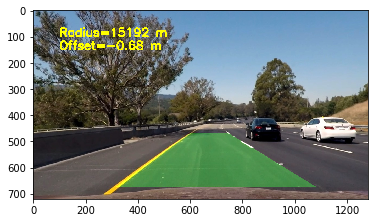

In [27]:
result=final_p(image)
plt.imshow(result)
plt.show()
#font = cv2.FONT_HERSHEY_SIMPLEX
#result=cv2.putText(result,'CHECK',(100,100), font, 1.5,(255,255,0),5)
#plt.imshow(result)

## TODO ADD ALL FINCTIONS NEEDED FOR THE BELLOW FUNCTION 

# PRIOR

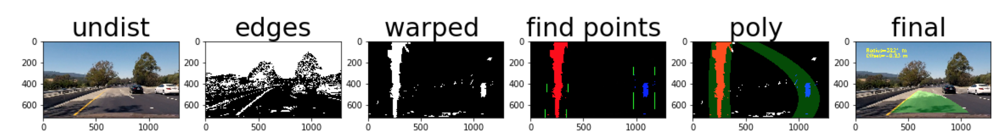

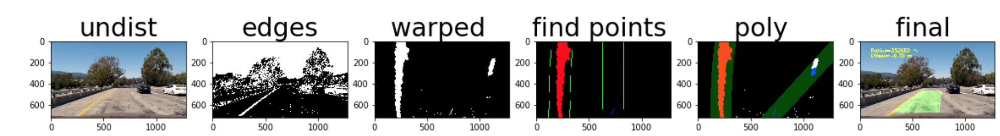

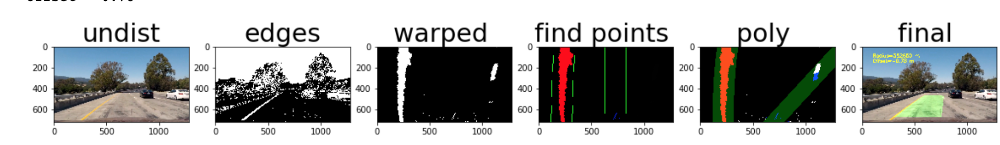

# NEXT

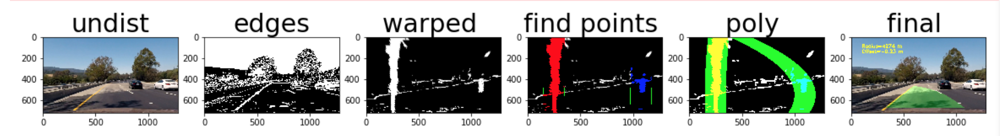

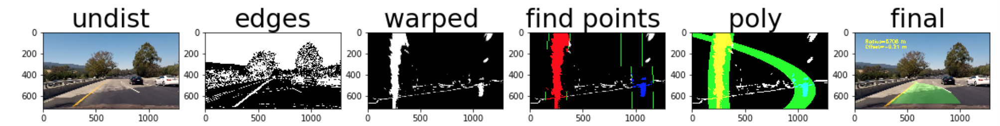

# !!! FINAL RUN

In [28]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor  import VideoFileClip
from IPython.display import HTML

In [30]:
white_output = 'output_video/project_video_mod.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("videos/project_video.mp4") #.subclip(0,5)

white_clip = clip1.fl_image(final_p) #NOTE: this functionexpects color images!!
%time white_clip.write_videofile(white_output, audio=False)
#%time my_clip.write_gif('test.gif', fps=12)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_video/project_video_mod.mp4.
Moviepy - Writing video output_video/project_video_mod.mp4



Moviepy - Done !
Moviepy - video ready output_video/project_video_mod.mp4
CPU times: user 4min 14s, sys: 1min 12s, total: 5min 26s
Wall time: 4min 30s


## Combine 2 videos together

In [ ]:
from moviepy.editor import VideoFileClip, clips_array, vfx
clip1 = VideoFileClip("output_video/project_video_mod.mp4").margin(10) # add 10px contour
clip2 = VideoFileClip("output_video/project_video_warped.mp4").margin(10) # add 10px contour
clip3 = VideoFileClip("output_video/project_video_edges.mp4").margin(10) # add 10px contour

final_clip = clips_array([[clip1, clip2],
                          [clip2, clip1]])
final_clip.resize(width=480).write_videofile("my_stack2.mp4")
##final_clip = clips_array([[clip1, clip2,clip3]])                 
##final_clip.resize(width=480).write_videofile("my_stack1.mp4")

# !!! CHALLELLENGE

- Пропадает линия остается только темная ( возможно нужно исльзовать другой подход)
- Возможно желтая линия выпадает совсем

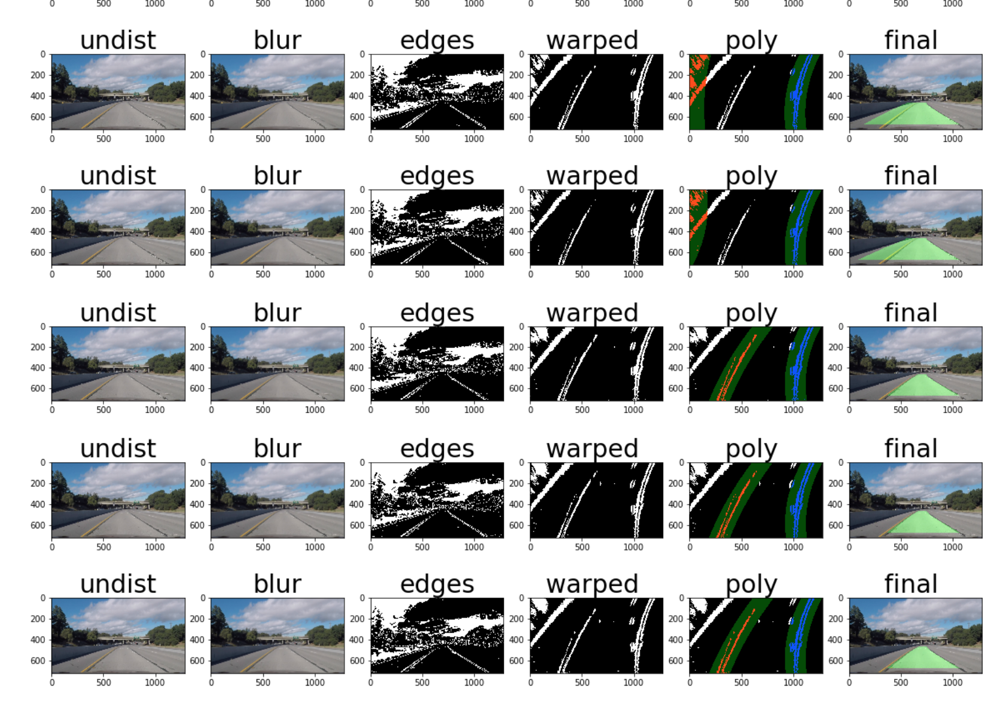

In [31]:
white_output = 'output_video/challenge_video_mod.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("videos/challenge_video.mp4").subclip(0,5)
white_clip = clip1.fl_image(final_p) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   0%|          | 0/150 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_video/challenge_video_mod.mp4.
Moviepy - Writing video output_video/challenge_video_mod.mp4



Moviepy - Done !
Moviepy - video ready output_video/challenge_video_mod.mp4
CPU times: user 29.6 s, sys: 8.39 s, total: 38 s
Wall time: 31.6 s


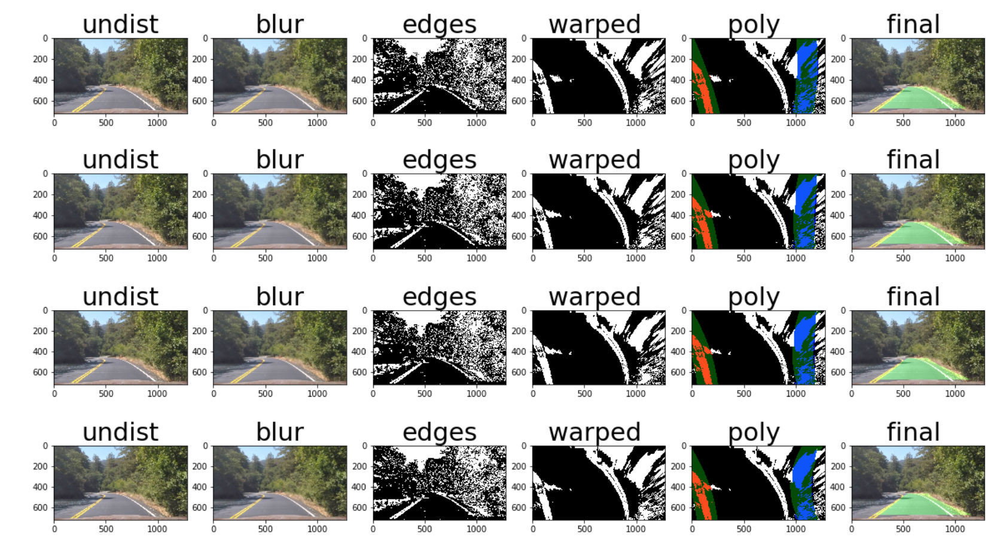

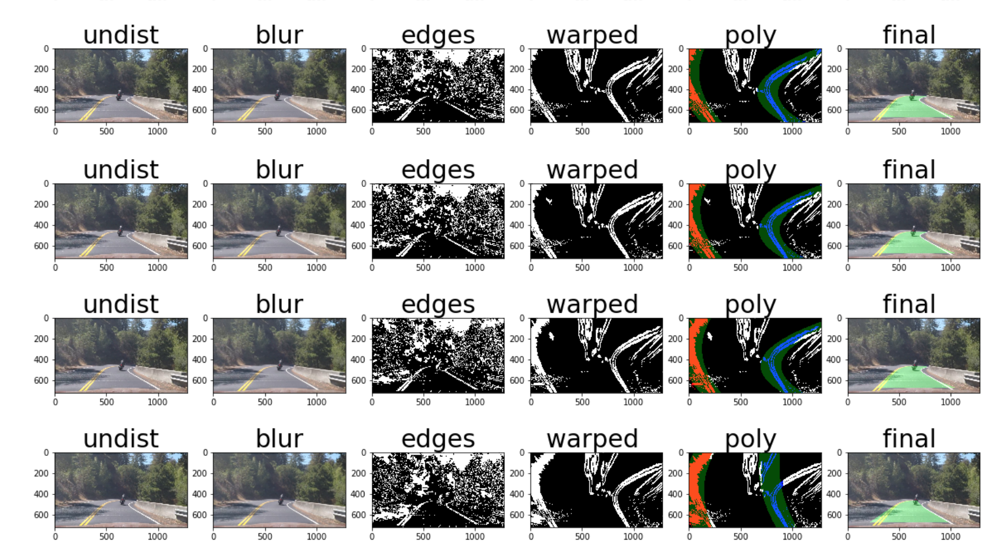

# !!! EXTRA CHALLENGE

In [32]:
white_output = 'output_video/harder_challenge_video_mod.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)
clip1 = VideoFileClip("videos/harder_challenge_video.mp4").subclip(0,5)

white_clip = clip1.fl_image(final_p) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

t:   0%|          | 0/125 [00:00<?, ?it/s, now=None]

Moviepy - Building video output_video/harder_challenge_video_mod.mp4.
Moviepy - Writing video output_video/harder_challenge_video_mod.mp4



Moviepy - Done !
Moviepy - video ready output_video/harder_challenge_video_mod.mp4
CPU times: user 29 s, sys: 7.07 s, total: 36.1 s
Wall time: 31.3 s
